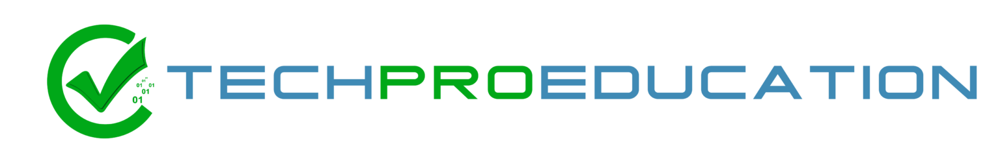

# **Adult Income Prediction**

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.


**Attribute Information:**

Age: Describes the age of individuals. Continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

fnlwgt(final weight): Continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

education-num: Number of years spent in education. Continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: Continuous.

capital-loss: Continuous.

hours-per-week: Continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

salary: >50K,<=50K

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

%matplotlib inline

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Exploratory Data Analysis and Visualization

In [2]:
df = pd.read_csv("adult.csv")
df

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,Some-college,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,<=50K
32557,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32558,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32559,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [4]:
df.shape

(32561, 15)

In [5]:
df.duplicated().sum()

24

In [3]:
df = df.drop_duplicates()

In [7]:
df.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [8]:
df.isna().sum()[df.isna().sum() > 0]

Series([], dtype: int64)

In [9]:
df["workclass"].value_counts()

Private             22673
Self-emp-not-inc     2540
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

In [10]:

for col in df.select_dtypes(include = "object"):
    print(col)
    print("***")
    print(df[col].value_counts())
    print("***********")

workclass
***
Private             22673
Self-emp-not-inc     2540
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64
***********
education
***
HS-grad         10494
Some-college     7282
Bachelors        5353
Masters          1722
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           645
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           332
1st-4th           166
Preschool          50
Name: education, dtype: int64
***********
marital.status
***
Married-civ-spouse       14970
Never-married            10667
Divorced                  4441
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: marital.status, dtype: int64
***********
occupation
***
Prof

In [11]:
df.isin(["?"]).any()

age               False
workclass          True
fnlwgt            False
education         False
education.num     False
marital.status    False
occupation         True
relationship      False
race              False
sex               False
capital.gain      False
capital.loss      False
hours.per.week    False
native.country     True
income            False
dtype: bool

In [12]:
df.isin(["?"]).sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education.num        0
marital.status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital.gain         0
capital.loss         0
hours.per.week       0
native.country     582
income               0
dtype: int64

In [4]:
df.replace("?", "Unknown", inplace=True)

In [14]:
df.isin(["?"]).sum()

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [15]:
df.groupby("education")["education.num"].value_counts(dropna=False)

education     education.num
10th          6                  933
11th          7                 1175
12th          8                  433
1st-4th       2                  166
5th-6th       3                  332
7th-8th       4                  645
9th           5                  514
Assoc-acdm    12                1067
Assoc-voc     11                1382
Bachelors     13                5353
Doctorate     16                 413
HS-grad       9                10494
Masters       14                1722
Preschool     1                   50
Prof-school   15                 576
Some-college  10                7282
Name: education.num, dtype: int64

In [6]:
df.drop("education.num", axis = 1, inplace=True)


In [5]:
df.groupby("relationship")["marital.status"].value_counts(dropna=False)

relationship    marital.status       
Husband         Married-civ-spouse       13178
                Married-AF-spouse            9
Not-in-family   Never-married             4694
                Divorced                  2403
                Widowed                    547
                Separated                  420
                Married-spouse-absent      211
                Married-civ-spouse          17
Other-relative  Never-married              611
                Married-civ-spouse         124
                Divorced                   110
                Separated                   55
                Widowed                     48
                Married-spouse-absent       32
                Married-AF-spouse            1
Own-child       Never-married             4481
                Divorced                   328
                Separated                   99
                Married-civ-spouse          95
                Married-spouse-absent       45
                Widowe

In [7]:
df.relationship = df.relationship.replace(["Not-in-family", "Other-relative",np.nan], "Unmarried")
df.relationship

0        Unmarried
1        Unmarried
2        Unmarried
3        Unmarried
4        Own-child
           ...    
32556    Unmarried
32557         Wife
32558      Husband
32559    Unmarried
32560    Own-child
Name: relationship, Length: 32537, dtype: object

In [19]:
df.relationship.value_counts()

Husband      13187
Unmarried    12718
Own-child     5064
Wife          1568
Name: relationship, dtype: int64

In [8]:
df["income"] = df["income"].map({"<=50K":0,">50K":1}) 

# <=50K 0 >50K 1 olacak şekilde mapledik
# Bu şekilde yapmasak da olurdu, direkt isimler ile de tahmin alabiliriz

In [21]:
df.select_dtypes(include = "object").describe()

,workclass,education,marital.status,occupation,relationship,race,sex,native.country
count,32537,32537,32537,32537,32537,32537,32537,32537
unique,9,16,7,15,4,5,2,42
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States
freq,22673,10494,14970,4136,13187,27795,21775,29153


In [22]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0
income,32537.0,0.240926,0.427652,0.0,0.0,0.0,0.0,1.0


In [23]:
df.corr()

,age,fnlwgt,capital.gain,capital.loss,hours.per.week,income
age,1.000000,-0.076447,0.077676,0.057745,0.068515,0.234037
fnlwgt,-0.076447,1.000000,0.000429,-0.010260,-0.018898,-0.009502
capital.gain,0.077676,0.000429,1.000000,-0.031639,0.078408,0.223336
capital.loss,0.057745,-0.010260,-0.031639,1.000000,0.054229,0.150501
hours.per.week,0.068515,-0.018898,0.078408,0.054229,1.000000,0.229658
income,0.234037,-0.009502,0.223336,0.150501,0.229658,1.000000


In [24]:
import cufflinks as cf
import pandas as pd
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
cf.go_offline()

# Then you can use the iplot method on a DataFrame
df[["capital.gain", "capital.loss"]].iplot(kind="box")

<AxesSubplot:>

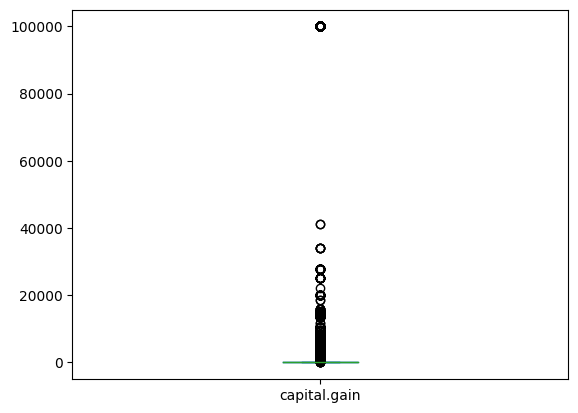

In [25]:
df["capital.gain"].plot(kind="box")

<AxesSubplot:xlabel='capital.loss'>

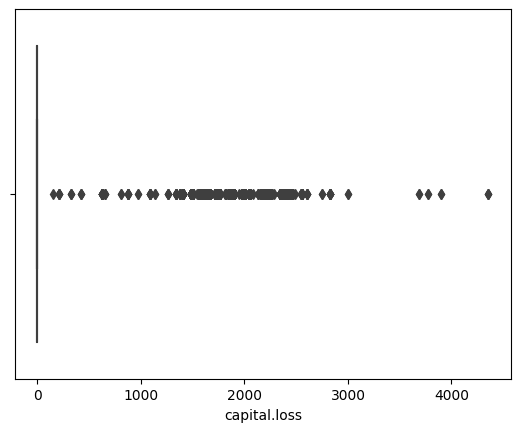

In [26]:
sns.boxplot(x="capital.loss", data=df)

In [27]:
df["income"].value_counts()  

0    24698
1     7839
Name: income, dtype: int64

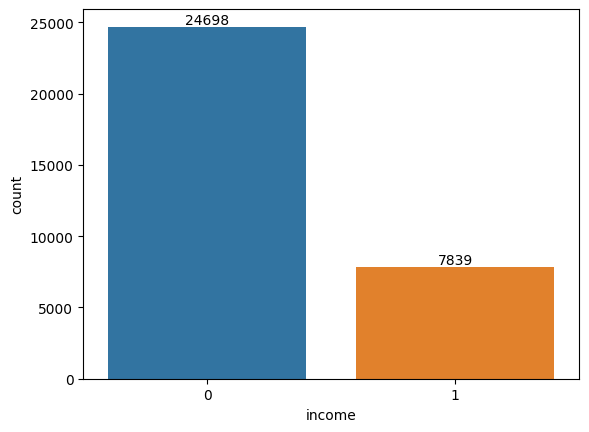

In [28]:
ax= sns.countplot(df["income"])
ax.bar_label(ax.containers[0]); 

# balanced bir data
# balanced datalarda hangi skora bakabiliriz?

**Balanced (dengeli) bir veri seti**, sınıflandırma problemlerinde her bir sınıfın benzer sayıda örnek içerdiği bir veri setidir. Örn; Kecimen: 450 - Besni: 450

**Unbalanced-Imbalanced (dengesiz) veri seti**, bir sınıfın diğerlerine göre çok daha fazla örneğe sahip olduğu durumlarda ortaya çıkar. Örn; diyabet (1): 3000 - diyabet olmayan (0): 500

Bu veri seti özelinde aynı sayıda iki sınıfa sahibiz. Bu yüzden modelin performansını değerlendirmek için **accuracy** kullanabiliriz.

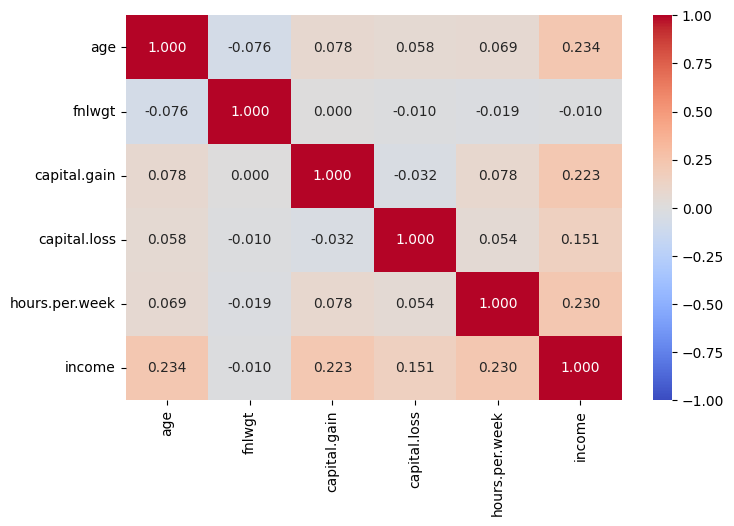

In [29]:
plt.figure(figsize=(8,5))
sns.heatmap(df.select_dtypes(include='number').corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='coolwarm');

In [30]:
# sns.pairplot(df, hue = "income");

#classların birbirinden net bir şekilde ayrıştığı yer göremiyorum
# ama iki boyutlu baktığımızı unutmayalım

In [31]:
import cufflinks as cf
import pandas as pd
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
cf.go_offline()

# Then you can use the iplot method on a DataFrame
df.iplot(kind="box")


In [32]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'marital.status',
       'occupation', 'relationship', 'race', 'sex', 'capital.gain',
       'capital.loss', 'hours.per.week', 'native.country', 'income'],
      dtype='object')

In [33]:
fig = px.scatter_3d(df, x='age', y='capital.gain', z='hours.per.week', color='income')
fig.show()

# üç boyutlu bakarsak classların aslında birbirinden iyi bir şekilde ayrıldığını ama modelimizin
# hata yapabileceği grift noktaların da olduğunu görüyoruz

# Logistic Regression

In [34]:
# Veri seti hakkinda detayli bilgi almak icin (Mert Bey'den);

def get_unique_values(df):
    
    output_data = []

    for col in df.columns:

        # If the number of unique values in the column is less than or equal to 5
        if df.loc[:, col].nunique() <= 10:
            # Get the unique values in the column
            unique_values = df.loc[:, col].unique()
            # Append the column name, number of unique values, unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

In [35]:
get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,age,73,-,int64
1,workclass,9,"[Unknown, Private, State-gov, Federal-gov, Sel...",object
2,fnlwgt,21648,-,int64
3,education,16,-,object
4,marital.status,7,"[Widowed, Divorced, Separated, Never-married, ...",object
5,occupation,15,-,object
6,relationship,4,"[Unmarried, Own-child, Husband, Wife]",object
7,race,5,"[White, Black, Asian-Pac-Islander, Other, Amer...",object
8,sex,2,"[Female, Male]",object
9,capital.gain,119,-,int64


In [36]:
pd.get_dummies(df.drop(["income", "native.country"], axis = 1), drop_first=True)

,age,fnlwgt,capital.gain,capital.loss,hours.per.week,workclass_Local-gov,workclass_Never-worked,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,...,occupation_Transport-moving,occupation_Unknown,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Asian-Pac-Islander,race_Black,race_Other,race_White,sex_Male
0,90,77053,0,4356,40,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
1,82,132870,0,4356,18,0,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
2,66,186061,0,4356,40,0,0,0,0,0,...,0,1,0,1,0,0,1,0,0,0
3,54,140359,0,3900,40,0,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
4,41,264663,0,3900,40,0,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,310152,0,0,40,0,0,1,0,0,...,0,0,0,1,0,0,0,0,1,1
32557,27,257302,0,0,38,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
32558,40,154374,0,0,40,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,1
32559,58,151910,0,0,40,0,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32537 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32537 non-null  int64 
 1   workclass       32537 non-null  object
 2   fnlwgt          32537 non-null  int64 
 3   education       32537 non-null  object
 4   marital.status  32537 non-null  object
 5   occupation      32537 non-null  object
 6   relationship    32537 non-null  object
 7   race            32537 non-null  object
 8   sex             32537 non-null  object
 9   capital.gain    32537 non-null  int64 
 10  capital.loss    32537 non-null  int64 
 11  hours.per.week  32537 non-null  int64 
 12  native.country  32537 non-null  object
 13  income          32537 non-null  int64 
dtypes: int64(6), object(8)
memory usage: 3.7+ MB


In [9]:
X=pd.get_dummies(df.drop(["income", "native.country"], axis = 1), drop_first=True)
y=df["income"]

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.10, 
                                                    stratify=y, 
                                                    random_state=42)

In [13]:
scaler =StandardScaler()

In [14]:
log_model = LogisticRegression()

In [15]:
log_pipe = Pipeline([("scaler",scaler),("log_model",log_model)]) 

In [43]:
log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log_model', LogisticRegression())])

In [44]:
y_pred=log_pipe.predict(X_test)
y_pred


array([1, 1, 0, ..., 0, 1, 1], dtype=int64)

In [45]:
y_pred_proba = log_pipe.predict_proba(X_test)
y_pred_proba

array([[0.31736198, 0.68263802],
       [0.1510695 , 0.8489305 ],
       [0.97549966, 0.02450034],
       ...,
       [0.99551394, 0.00448606],
       [0.32769551, 0.67230449],
       [0.34806312, 0.65193688]])

In [10]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))
    
# hem train hem de test seti scorlarını gözlemleyebilmek için eval_metric fornksiyonumuzu tanımlıyoruz.

In [47]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 


Test_Set
[[2297  173]
 [ 319  465]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      2470
           1       0.73      0.59      0.65       784

    accuracy                           0.85      3254
   macro avg       0.80      0.76      0.78      3254
weighted avg       0.84      0.85      0.84      3254


Train_Set
[[20706  1522]
 [ 2796  4259]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.91     22228
           1       0.74      0.60      0.66      7055

    accuracy                           0.85     29283
   macro avg       0.81      0.77      0.78     29283
weighted avg       0.85      0.85      0.85     29283



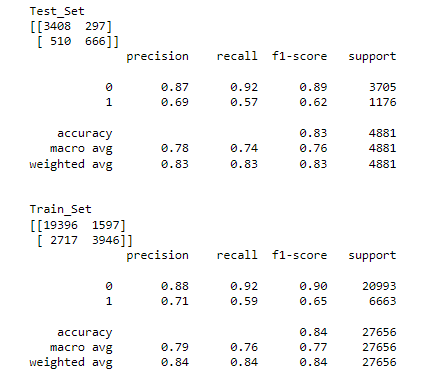

In [11]:
from sklearn.model_selection import GridSearchCV

In [16]:
# pipeline for logistic regression

model = Pipeline([("scaler",scaler),("log_model",log_model)]) 

# l1: Lasso, l2: Ridge
penalty = ["l1", "l2"] 

# -1 ile 5 arasında 20 tane C değeri elde etmek için 
# C arttıkça regülarizasyon düşer, alphanın tersi olarak
# C için np.logspace kullanmanın nedeni, düzenlileştirmenin optimal değerinin genellikle belirli bir aralıkta olmamasıdır.
# Bu nedenle, geniş bir aralıkta farklı değerleri denemek ve en iyi sonucu veren değeri bulmak için logaritmik bir ölçekte
# değerler oluşturmak mantıklıdır.
C = np.logspace(-1, 5, 20) 

# balanced: sınıf ağırlıkları dengeli, None: sınıf ağırlığı yok
class_weight= ["balanced", None] 
# dengesiz data setlerinde classları dengelemek için class_weight= "balanced" kullanabiliyoruz. Data dengelendiği zaman
# model az olan sınıfa ait precision scorunu artırarak o sınıfın recall scorunu artırmaya çalışır.

# solver ın dört değeri
solver = ["liblinear", "sag", "saga"] 

# penalty, C, class_weight ve solver'ın tüm kombinasyonlarını elde etmek için
param_grid = {"log_model__penalty" : penalty,
              "log_model__C" : C,
              "log_model__class_weight":class_weight,
              "log_model__solver":solver} 

# en iyi modeli elde etmek için
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=10,
                          scoring = 'f1',   # Default olarak 1 sınıfının scorunu max. eder    
                          n_jobs = -1) # bütün işlemciler burda çalışsın diye

# GrdiseachCV aynı zamanda Cross Validation işlemi de yaptığı için validation ve train seti scorlarını elde edebilmek için
# return_train_score=True olarak belirtiyoruz. (scoring karşına yazdığımız metric scorunu döndürür sadece)

In [50]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('log_model', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'log_model__C': array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02, 1.27427499e+03, 2.63665090e+03, 5.45559478e+03,
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                         'log_model__class_weight': ['balanced', None],
                         'log_model__penalty': ['l1', 'l2'],
                         'log_model__solver': ['liblinear', 'sag', 'saga']},
             scoring='f1')

In [51]:
grid_model.best_params_


{'log_model__C': 0.1,
 'log_model__class_weight': 'balanced',
 'log_model__penalty': 'l1',
 'log_model__solver': 'liblinear'}

In [52]:
grid_model.best_score_

0.6851519631802624

In [53]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  


Test_Set
[[1984  486]
 [ 150  634]]
              precision    recall  f1-score   support

           0       0.93      0.80      0.86      2470
           1       0.57      0.81      0.67       784

    accuracy                           0.80      3254
   macro avg       0.75      0.81      0.76      3254
weighted avg       0.84      0.80      0.81      3254


Train_Set
[[17814  4414]
 [ 1048  6007]]
              precision    recall  f1-score   support

           0       0.94      0.80      0.87     22228
           1       0.58      0.85      0.69      7055

    accuracy                           0.81     29283
   macro avg       0.76      0.83      0.78     29283
weighted avg       0.86      0.81      0.82     29283



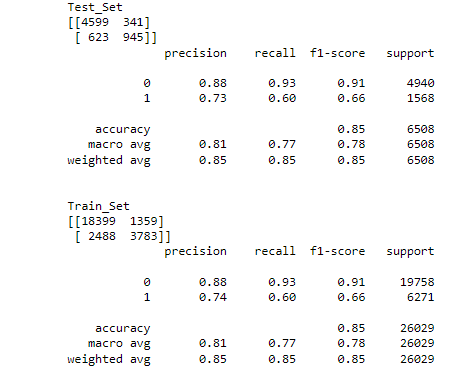

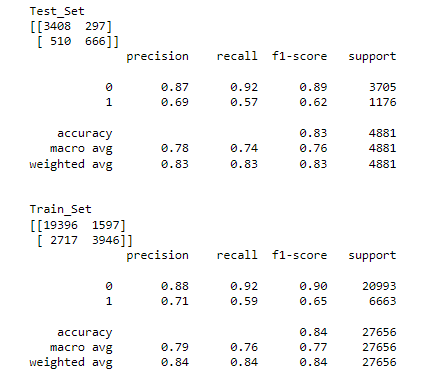

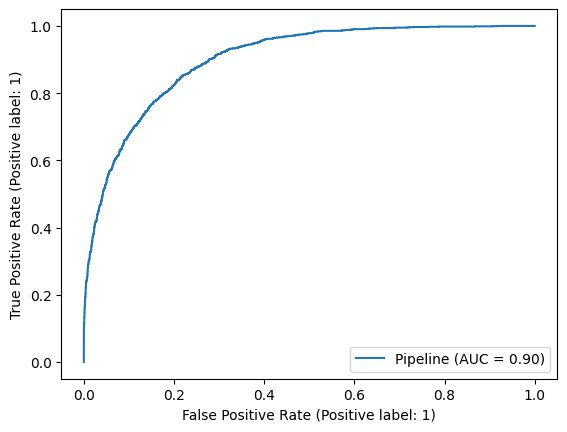

In [54]:
plot_roc_curve(log_pipe, X_test, y_test); 


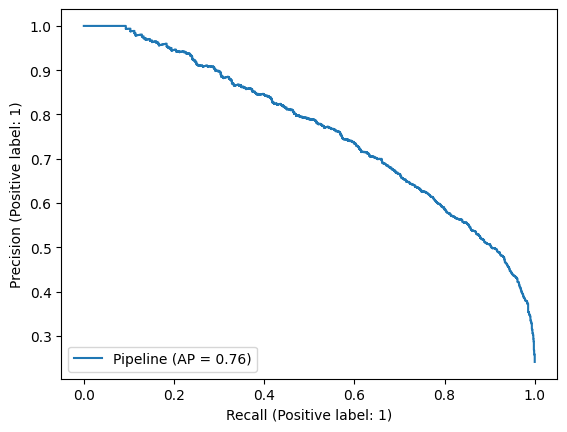

In [57]:
plot_precision_recall_curve(log_pipe, X_test, y_test);

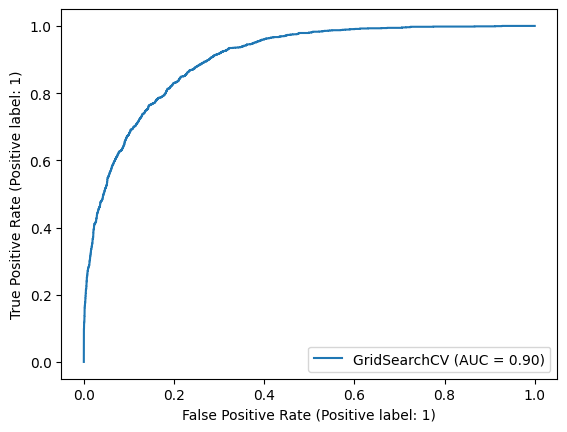

In [53]:
plot_roc_curve(grid_model, X_test, y_test); 


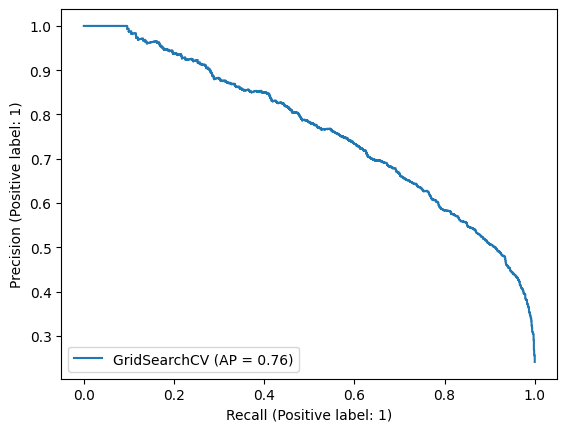

In [55]:
plot_precision_recall_curve(grid_model, X_test, y_test);

# K-Nearest Neighbors (KNN) Classification

In [23]:
scaler = StandardScaler()

In [24]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Modelling

In [25]:
from sklearn.neighbors import KNeighborsClassifier

In [26]:
knn_model = KNeighborsClassifier(n_neighbors=5) 
#default değer 5 k=5 k değerini burada veriyoruz


# weights='uniform'  her komsuya esit mesafede. 
# algorithm='auto' bunu elleme. Daha uzman ayarlamalar icin bu.
# leaf_size=30  yaprak sayisi, elleme
# p komsularin uzakligini olcmek icin kullanilan metrigi gosterir. Defaultu Eucludian (kus ucusu uzaklik). 
# metrics --> elleme
# metrics_params  --> elleme

In [27]:
knn_model.fit(X_train_scaled,y_train)

KNeighborsClassifier()

In [28]:
y_pred = knn_model.predict(X_test_scaled)
y_pred

array([0, 1, 0, ..., 0, 1, 1], dtype=int64)

In [29]:
y_pred_proba = knn_model.predict_proba(X_test_scaled)

In [30]:
pd.DataFrame(y_pred_proba)

,0,1
0,0.6,0.4
1,0.2,0.8
2,1.0,0.0
3,0.6,0.4
4,1.0,0.0
...,...,...
3249,0.0,1.0
3250,1.0,0.0
3251,0.8,0.2
3252,0.2,0.8


In [70]:
my_dict = {"Actual": y_test, "Pred":y_pred, "Proba_1":y_pred_proba[:,1], "Proba_0":y_pred_proba[:,0]}

In [71]:
pd.DataFrame.from_dict(my_dict).sample(10)

,Actual,Pred,Proba_1,Proba_0
26661,0,0,0.0,1.0
9095,1,0,0.0,1.0
22631,1,0,0.2,0.8
5758,0,0,0.0,1.0
14581,1,0,0.2,0.8
31105,0,0,0.0,1.0
30432,0,0,0.2,0.8
7324,0,0,0.0,1.0
28941,1,1,0.6,0.4
1787,1,1,1.0,0.0


In [72]:
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

In [73]:
confusion_matrix(y_test, y_pred)

array([[2223,  247],
       [ 342,  442]], dtype=int64)

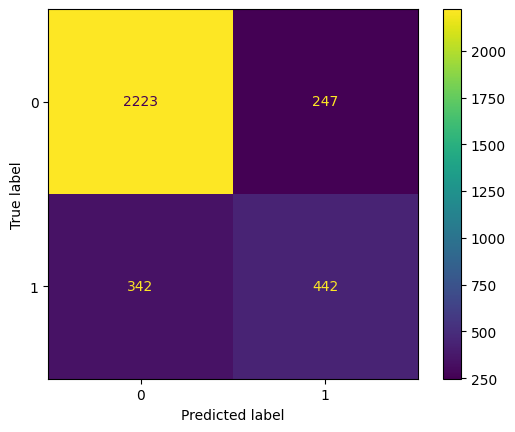

In [74]:
plot_confusion_matrix(knn_model, X_test_scaled, y_test);

In [ ]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

## Elbow Method for Choosing Reasonable K Values

In [79]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

In [ ]:
test_error_rates = []
train_error_rates = []

for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_scaled,y_train) 
   
    y_pred_test = knn_model.predict(X_test_scaled)
    y_pred_train = knn_model.predict(X_train_scaled)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    test_error_rates.append(test_error)
    
    train_error = 1 - accuracy_score(y_train,y_pred_train)
    train_error_rates.append(train_error)

In [ ]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')

plt.xticks(range(0, 31, 1));



In [ ]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.plot(range(1,30), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')

plt.xticks(range(0, 31, 1));

## Scores by Various K Values

*  **Gridsearch en iyi skoru aradığı için optimum k değerini kaçırabilir. Optimum skoru yakalarken, en yükseğe gidip bi düşüğüne gelir. Bu yüzden Elbow modeli sayesinde k = 9 değerini (modelin iş yükünü azaltacak skor) yakalar**

In [ ]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set\n")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set\n")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [ ]:
knn = KNeighborsClassifier(n_neighbors=8)

knn.fit(X_train_scaled,y_train)
print('WITH K=8\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=11)

knn.fit(X_train_scaled,y_train)
print('WITH K=11\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

#Overfit var
# k düştükçe overfit'e gider

In [ ]:
knn = KNeighborsClassifier(n_neighbors=14)

knn.fit(X_train_scaled,y_train)
print('WITH K=14\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=26)

knn.fit(X_train_scaled,y_train)
print('WITH K=26\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

## Cross Validate For Optimal K Value

In [ ]:
from sklearn.model_selection import cross_val_score, cross_validate

In [ ]:
model = KNeighborsClassifier(n_neighbors=14)

scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

In [ ]:
df_scores.mean()[2:]

## Gridsearch Method for Choosing Reasonable K Values

In [31]:
from sklearn.model_selection import GridSearchCV

In [32]:
knn_grid = KNeighborsClassifier()

In [33]:
k_values= range(1,30)

In [34]:
param_grid = {"n_neighbors":k_values, "p": [1,2], "weights": ['uniform', "distance"]}

In [35]:
knn_grid_model = GridSearchCV(knn_grid, 
                              param_grid, 
                              cv=10, 
                              scoring= 'f1')

In [36]:
knn_grid_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 30), 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='f1')

In [37]:
knn_grid_model.best_params_

{'n_neighbors': 20, 'p': 1, 'weights': 'distance'}

In [38]:
print('WITH K=20\n')
eval_metric(knn_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=20

Test_Set
[[2261  209]
 [ 340  444]]
              precision    recall  f1-score   support

           0       0.87      0.92      0.89      2470
           1       0.68      0.57      0.62       784

    accuracy                           0.83      3254
   macro avg       0.77      0.74      0.75      3254
weighted avg       0.82      0.83      0.83      3254


Train_Set
[[22228     0]
 [    1  7054]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     22228
           1       1.00      1.00      1.00      7055

    accuracy                           1.00     29283
   macro avg       1.00      1.00      1.00     29283
weighted avg       1.00      1.00      1.00     29283



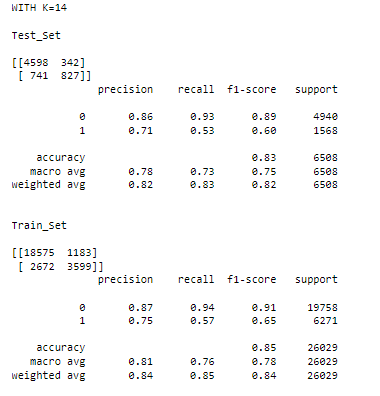

In [105]:
from sklearn.model_selection import GridSearchCV

In [106]:
param_grid = {'knn__n_neighbors': range(1,30)}
pipe_model = Pipeline([("scaler", StandardScaler()), ("knn", KNeighborsClassifier())])

In [107]:
pipe_grid = GridSearchCV(pipe_model, param_grid, cv=10, scoring= 'f1')

In [108]:
pipe_grid.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             param_grid={'knn__n_neighbors': range(1, 30)}, scoring='f1')

In [155]:
pipe_grid.best_params_

{'knn__n_neighbors': 7}

In [156]:
print('WITH K=7\n')
eval_metric(pipe_grid, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=7

Test_Set

[[4736  204]
 [1028  540]]
              precision    recall  f1-score   support

           0       0.82      0.96      0.88      4940
           1       0.73      0.34      0.47      1568

    accuracy                           0.81      6508
   macro avg       0.77      0.65      0.68      6508
weighted avg       0.80      0.81      0.78      6508


Train_Set

[[19056   702]
 [ 3974  2297]]
              precision    recall  f1-score   support

           0       0.83      0.96      0.89     19758
           1       0.77      0.37      0.50      6271

    accuracy                           0.82     26029
   macro avg       0.80      0.67      0.69     26029
weighted avg       0.81      0.82      0.80     26029



# Decision Tree Classification

In [110]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
DT_model = DecisionTreeClassifier(random_state=101)

In [111]:
DT_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=101)

In [112]:
y_pred = DT_model.predict(X_test)

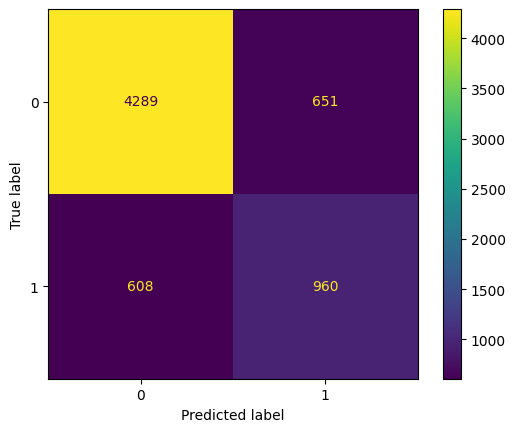

In [113]:
plot_confusion_matrix(DT_model,X_test,y_test)
plt.show()

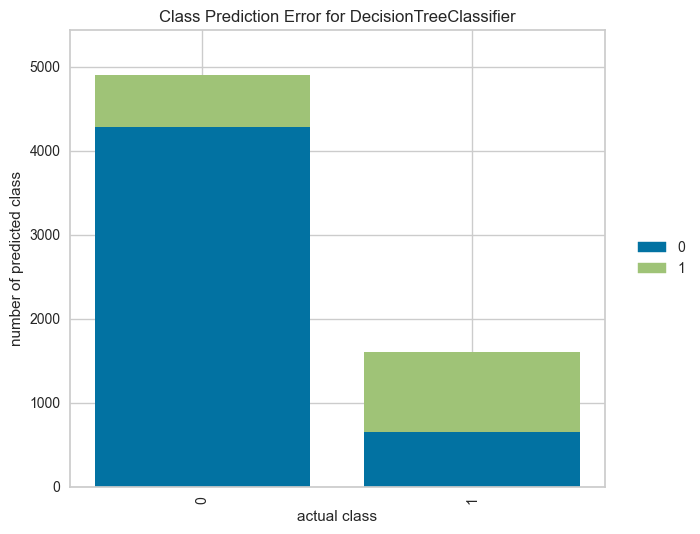

In [115]:
from yellowbrick.classifier import ClassPredictionError


visualizer = ClassPredictionError(DT_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

# yukarıdaki heatmap'in farklı grafiğinin yorumlanması gibi hataların hangi sınıfa ait olduğunu veriyor 

In [116]:
eval_metric(DT_model, X_train, y_train, X_test, y_test)

Test_Set

[[4289  651]
 [ 608  960]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.87      4940
           1       0.60      0.61      0.60      1568

    accuracy                           0.81      6508
   macro avg       0.74      0.74      0.74      6508
weighted avg       0.81      0.81      0.81      6508


Train_Set

[[19758     0]
 [    0  6271]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19758
           1       1.00      1.00      1.00      6271

    accuracy                           1.00     26029
   macro avg       1.00      1.00      1.00     26029
weighted avg       1.00      1.00      1.00     26029



micro avg/ Accuracy = Target daki sınıf sayılarım eşitse veya yakınsa (Balanced data)

macro avg  = datamda bir dengesizlik (unbalanced) varsa bakıyordum.

weight avg = eğer datam dengesiz/dengeli ancak ben sayısı yüksek olana göre bakmak istiyorsam kullanıyordum

## Cross Validate

Micro avg ile accuracy aynıdır. aşağıda ispatı mevcut

In [118]:
model = DecisionTreeClassifier(random_state=101)

scores = cross_validate(model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision_micro,test_recall_micro,test_f1_micro
1,0.181552,0.003997,0.812524,0.812524,0.812524,0.812524
2,0.140887,0.003999,0.816366,0.816366,0.816366,0.816366
3,0.164602,0.004000,0.815597,0.815597,0.815597,0.815597
4,0.155636,0.005003,0.810219,0.810219,0.810219,0.810219
5,0.151569,0.006999,0.823665,0.823665,0.823665,0.823665
6,0.138376,0.004004,0.802536,0.802536,0.802536,0.802536
7,0.177484,0.005013,0.805609,0.805609,0.805609,0.805609
8,0.175911,0.005131,0.806761,0.806761,0.806761,0.806761
9,0.170979,0.005998,0.812908,0.812908,0.812908,0.812908
10,0.153575,0.007989,0.824750,0.824750,0.824750,0.824750


In [119]:
df_scores.mean()[2:]

test_accuracy           0.813094
test_precision_micro    0.813094
test_recall_micro       0.813094
test_f1_micro           0.813094
dtype: float64

## Feature Importances

In [151]:
DT_model.feature_importances_

array([1.16871165e-01, 1.95471131e-01, 1.22889501e-01, 5.43852221e-02,
       6.65185589e-02, 6.48546509e-03, 0.00000000e+00, 1.23451646e-02,
       5.89553117e-03, 1.01834629e-02, 5.99569710e-03, 1.80396384e-03,
       0.00000000e+00, 1.56307548e-03, 1.22183019e-03, 1.40051074e-04,
       1.25437074e-03, 2.86485907e-03, 1.58207339e-03, 4.48102664e-03,
       4.33446598e-03, 1.54947317e-02, 3.96644508e-03, 7.32065341e-03,
       7.29761943e-03, 2.09832619e-04, 3.41730095e-03, 8.47090430e-03,
       2.14665584e-04, 1.99338282e-01, 6.37471073e-04, 2.94906663e-03,
       9.38629493e-04, 1.77917818e-03, 0.00000000e+00, 7.03659531e-03,
       2.81981272e-02, 2.90128015e-03, 3.08203736e-03, 5.12310420e-03,
       5.70697598e-03, 1.79117952e-04, 2.50970148e-02, 3.77045101e-03,
       8.23533624e-03, 3.98988571e-03, 5.82935596e-03, 1.30627963e-03,
       7.43206458e-04, 9.64395037e-04, 6.07134206e-03, 2.46400970e-03,
       5.22107661e-03, 7.25089827e-04, 7.34016197e-03, 7.69376156e-03])

In [152]:
df_f_i = pd.DataFrame(index=X.columns, data = DT_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
df_f_i

,Feature Importance
workclass_Without-pay,0.000000
occupation_Armed-Forces,0.000000
workclass_Never-worked,0.000000
education_1st-4th,0.000140
occupation_Priv-house-serv,0.000179
education_Preschool,0.000210
marital.status_Married-AF-spouse,0.000215
marital.status_Married-spouse-absent,0.000637
race_Other,0.000725
relationship_Own-child,0.000743


DT de eğer bir feature çok yüksek bir importance değerine sahipse onu düşürüp birde öyle skor alın sonra bunları karşılaştırın. Sebebi DT güçlü bulduğu featureler üzerinden ilerler diğerlerini kale almaz.

En önemlisi kanat uzunluğu ve gaga uzunluğu en önemli %90 oranında bizim için önemli

işte bu durum bizim modelimizin overfitting e gitmesine neden olabiliyor. DT önemli featurelerle eğer datanın örnke verecek olursak %90 ını ayırt edebiliyorsa diğer featureleri kullanmaz önemsizleştirir. Buda o featurelerden alacağımız insight lardan bizi yoksun bırakır.

hatırlarsanız modelimiz çok compexity olduğunda bizi overfittinge götürüyor demiştim. işte size bir overfitting sebebi daha eğer çok önemli bir feature varsa bu da bizi overfittinge götürebilir.

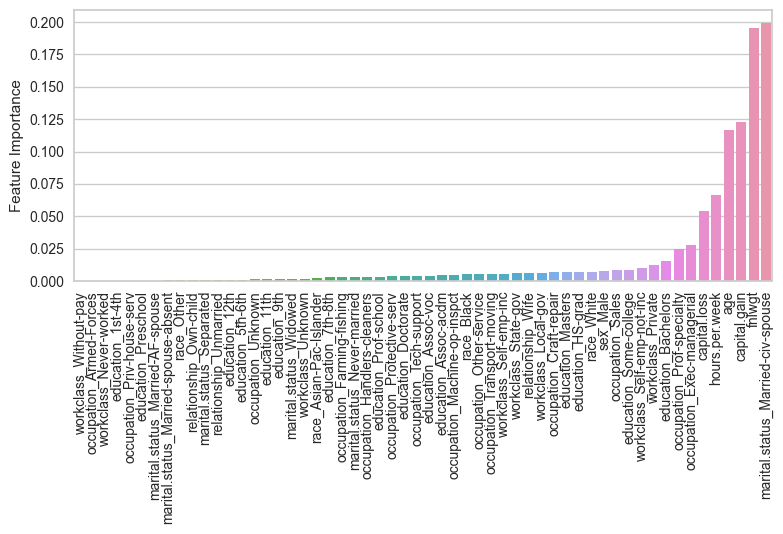

In [154]:
sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

## Drop most important feature

In [146]:
X2 = X.drop(columns = ["marital.status_Married-civ-spouse"])

In [147]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.2, random_state=101)

In [148]:
DT2_model = DecisionTreeClassifier(random_state=101)

In [149]:
DT2_model.fit(X_train2, y_train2) 

DecisionTreeClassifier(random_state=101)

In [150]:
eval_metric(DT2_model, X_train2, y_train2, X_test2, y_test2)

Test_Set

[[4305  618]
 [ 586  999]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      4923
           1       0.62      0.63      0.62      1585

    accuracy                           0.81      6508
   macro avg       0.75      0.75      0.75      6508
weighted avg       0.82      0.81      0.82      6508


Train_Set

[[19775     0]
 [    2  6252]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19775
           1       1.00      1.00      1.00      6254

    accuracy                           1.00     26029
   macro avg       1.00      1.00      1.00     26029
weighted avg       1.00      1.00      1.00     26029



In [129]:
df_f_i2 = pd.DataFrame(index=X2.columns, data = DT2_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
df_f_i2

,Feature Importance
occupation_Priv-house-serv,0.000000
occupation_Armed-Forces,0.000000
workclass_Never-worked,0.000000
workclass_Without-pay,0.000000
education_1st-4th,0.000019
marital.status_Married-AF-spouse,0.000100
education_Preschool,0.000206
education_12th,0.000501
marital.status_Married-spouse-absent,0.000501
marital.status_Separated,0.000520


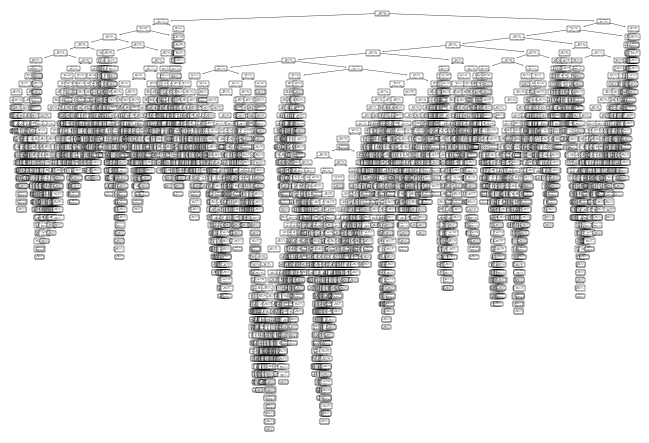

In [161]:
from sklearn.tree import plot_tree

plot_tree(DT_model);

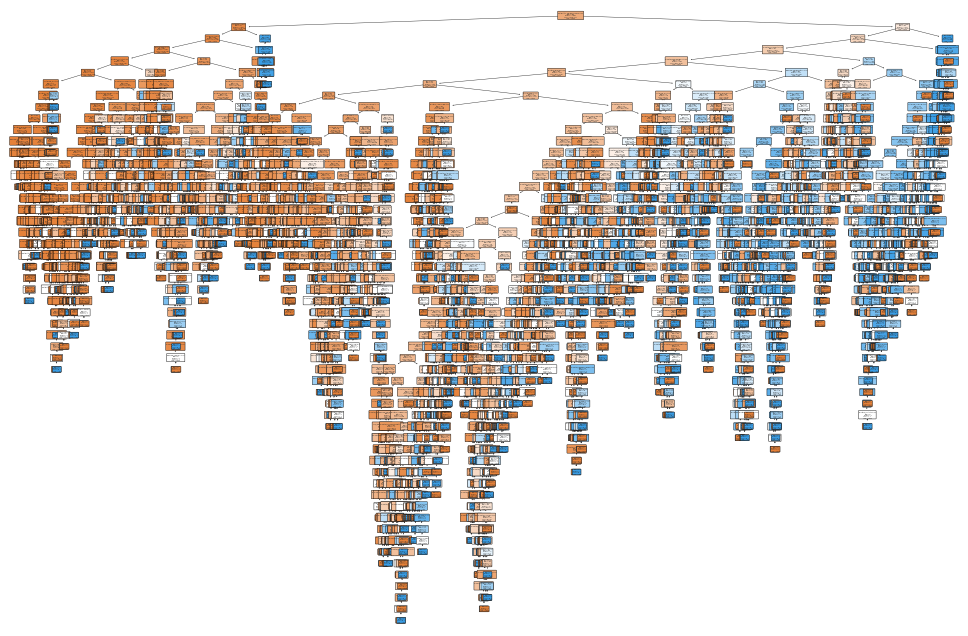

In [162]:
df["income"] = df["income"].map({0:"<=50K", 1: ">50K"}) 

plt.figure(figsize=(12,8),dpi=100)
plot_tree(DT_model, filled=True, feature_names=X.columns, rounded=True, class_names=df.income.unique());
plt.show()

In [ ]:
def report_model(model):
    model_pred = model.predict(X_test)
    model_train_pred = model.predict(X_train)
    print('\n')
    print("Test Set")
    print(confusion_matrix(y_test, model_pred))
    print('\n')
    print(classification_report(y_test,model_pred))
    print('\n')
    print("Train Set")
    print(confusion_matrix(y_train, model_train_pred))
    print('\n')
    print(classification_report(y_train,model_train_pred))
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, class_names=df.species.unique());

## Find Best Parameters

In [163]:
from sklearn.model_selection import GridSearchCV

In [164]:
model = DecisionTreeClassifier(random_state=101)

In [165]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto", "log2", 2, 3, 4, 5, 6, 7],
              "max_depth": [None, 2, 3, 4, 5],
              "min_samples_leaf": [1, 2, 3, 4, 5, 6, 7],
              "min_samples_split": [2, 3, 5, 6, 7, 8, 9]}

In [166]:
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1_micro',
                          cv=10,
                          n_jobs = -1)

In [167]:
grid_model.fit(X_train2, y_train2)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=101),
             n_jobs=-1,
             param_grid={'max_depth': [None, 2, 3, 4, 5],
                         'max_features': [None, 'auto', 'log2', 2, 3, 4, 5, 6,
                                          7],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_split': [2, 3, 5, 6, 7, 8, 9],
                         'splitter': ['best', 'random']},
             scoring='f1_micro')

In [168]:
grid_model.best_params_

{'max_depth': None,
 'max_features': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'splitter': 'random'}

In [169]:
eval_metric(grid_model, X_train2, y_train2, X_test2, y_test2)

Test_Set

[[4556  367]
 [ 688  897]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      4923
           1       0.71      0.57      0.63      1585

    accuracy                           0.84      6508
   macro avg       0.79      0.75      0.76      6508
weighted avg       0.83      0.84      0.83      6508


Train_Set

[[18849   926]
 [ 2148  4106]]
              precision    recall  f1-score   support

           0       0.90      0.95      0.92     19775
           1       0.82      0.66      0.73      6254

    accuracy                           0.88     26029
   macro avg       0.86      0.80      0.83     26029
weighted avg       0.88      0.88      0.88     26029

